<a href="https://colab.research.google.com/github/saikiran2702/Wine-quality-prediction/blob/main/WQP_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Data Exploration

In [ ]:
#Importing the basic librarires

import os
import math
import scipy
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
from sklearn import tree
from scipy.stats import randint
from scipy.stats import loguniform
from IPython.display import display

from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

#from scikitplot.metrics import plot_roc_curve as auc_roc
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, \
f1_score, roc_auc_score, roc_curve, precision_score, recall_score

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10,6]

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 50)


In [ ]:
#Importing the dataset

df = pd.read_csv("WineQT.csv")
#df.drop([''],axis=1, inplace=True)

target = 'quality'
labels = ['Quality-3','Quality-4','Quality-5','Quality-6','Quality-7','Quality-8']
features = [i for i in df.columns.values if i not in [target]]

original_df = df.copy(deep=True)
display(df)

print('\n\033[1mInference:\033[0m The Datset consists of {} features & {} samples.'.format(df.shape[1], df.shape[0]))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595



Inference: The Datset consists of 13 features & 1143 samples.


In [ ]:
#Checking the dtypes of all the columns

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [ ]:

df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595
1142,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,1597


In [ ]:
#Checking number of unique rows in each feature

df.nunique().sort_values()

,0
quality,6
free sulfur dioxide,53
alcohol,61
citric acid,77
residual sugar,80
pH,87
sulphates,89
fixed acidity,91
chlorides,131
volatile acidity,135


In [ ]:
#Checking number of unique rows in each feature

nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; #numerical & categorical features

for i in range(df[features].shape[1]):
    if nu.values[i]<=7:cf.append(nu.index[i])
    else: nf.append(nu.index[i])

print('\n\033[1mInference:\033[0m The Datset has {} numerical & {} categorical features.'.format(len(nf),len(cf)))



Inference: The Datset has 12 numerical & 0 categorical features.


In [ ]:
#Checking the stats of all the columns

display(df.describe())


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


2. Exploratory Data Analysis (EDA)


            Target Variable Distribution           


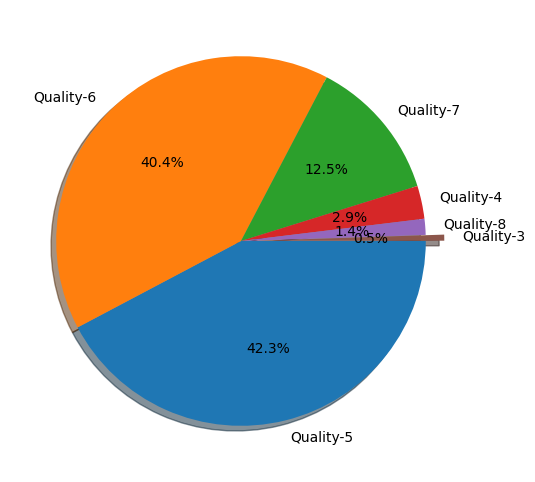

In [ ]:
#Let us first analyze the distribution of the target variable

MAP={}
for e, i in enumerate(sorted(df[target].unique())):
    MAP[i]=labels[e]
#MAP={0:'Not-Survived',1:'Survived'}
df1 = df.copy()
df1[target]=df1[target].map(MAP)
explode=np.zeros(len(labels))
explode[-1]=0.1
print('\033[1mTarget Variable Distribution'.center(55))
plt.pie(df1[target].value_counts(), labels=df1[target].value_counts().index, counterclock=False, shadow=True,
        explode=explode, autopct='%1.1f%%', radius=1, startangle=0)
plt.show()

In [ ]:
#Visualising the categorical features

print('\033[1mVisualising Categorical Features:'.center(100))

n=3
plt.figure(figsize=[15,3*math.ceil(len(cf)/n)])

for i in range(len(cf)):
    if df[cf[i]].nunique()<=6:
        plt.subplot(math.ceil(len(cf)/n),n,i+1)
        sns.countplot(df[cf[i]])
    else:
        plt.subplot(3,1,i-1)
        sns.countplot(df[cf[i]])
plt.tight_layout()
plt.show()

                               Visualising Categorical Features:                                


<Figure size 1500x0 with 0 Axes>

                                     Features Distribution                                      


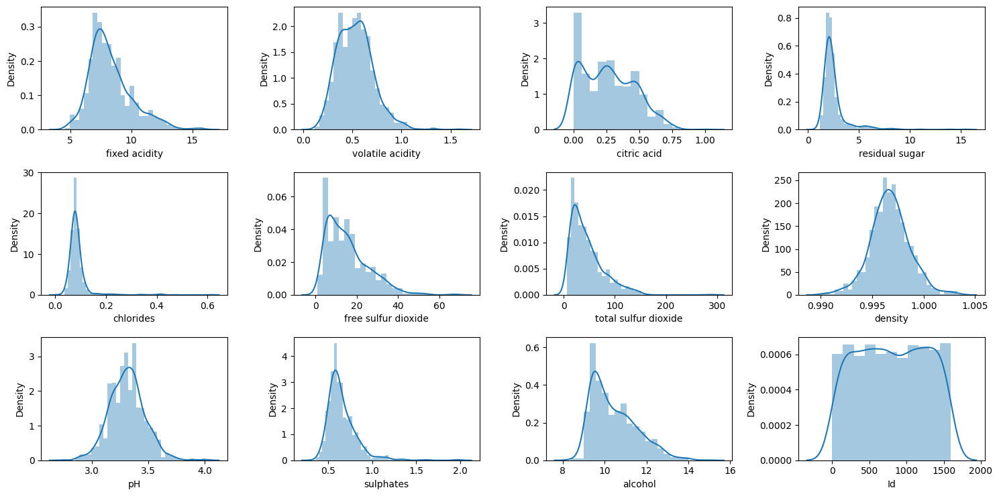

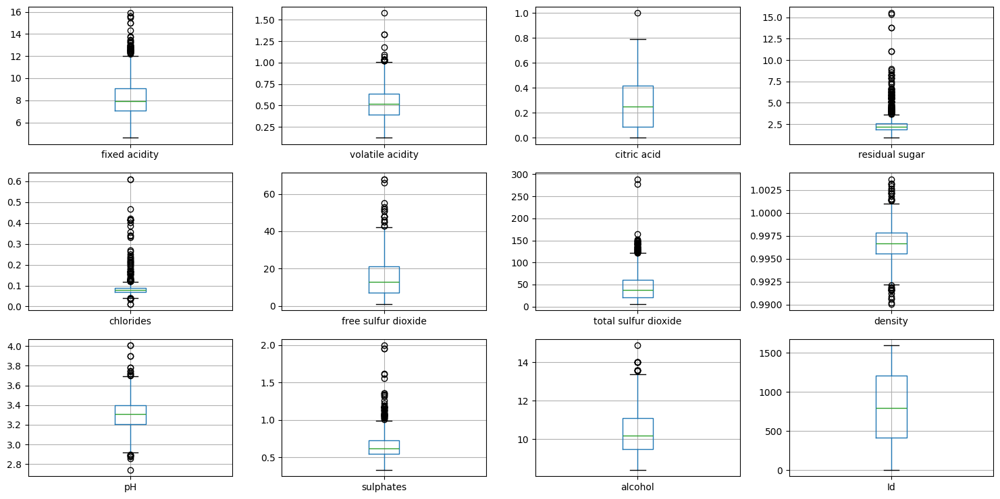

In [ ]:
#Understanding the feature set

print('\033[1mFeatures Distribution'.center(100))

nf = [i for i in features if i not in cf]

n=4
plt.figure(figsize=[15,2.5*math.ceil(len(features)/n)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/n),n,c+1)
    sns.distplot(df[nf[c]])
plt.tight_layout()
plt.show()

plt.figure(figsize=[15,2.5*math.ceil(len(features)/n)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/n),n,c+1)
    df.boxplot(nf[c])
plt.tight_layout()
plt.show()

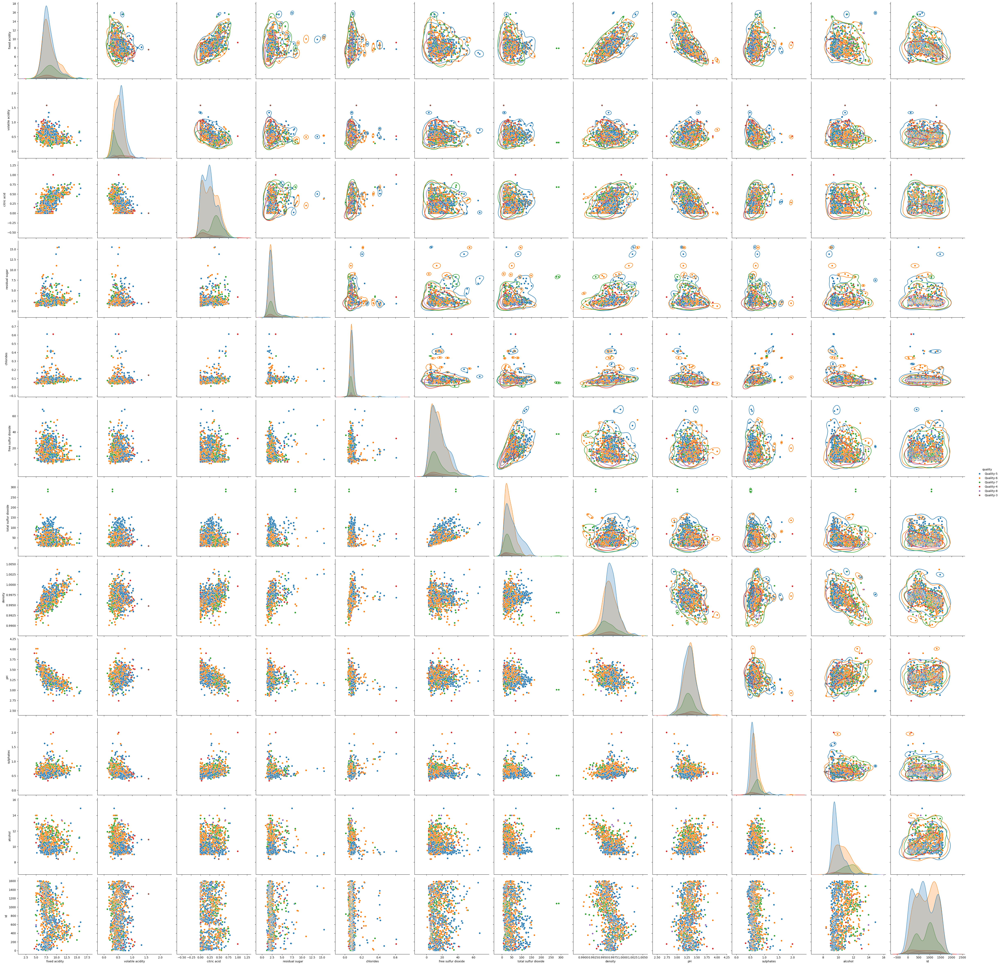

In [ ]:
#Understanding the relationship between all the features

g=sns.pairplot(df1, hue=target, size=4)
g.map_upper(sns.kdeplot, levels=1, color=".2")
plt.show()

3. Data Preprocessing

In [ ]:
#Removal of any Duplicate rows (if any)

counter = 0
r,c = original_df.shape

df1 = df.copy()
df1.drop_duplicates(inplace=True)
df1.reset_index(drop=True,inplace=True)

if df1.shape==(r,c):
    print('\n\033[1mInference:\033[0m The dataset doesn\'t have any duplicates')
else:
    print(f'\n\033[1mInference:\033[0m Number of duplicates dropped ---> {r-df1.shape[0]}')


Inference: The dataset doesn't have any duplicates


In [ ]:
#Check for empty elements

nvc = pd.DataFrame(df1.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = round(nvc['Total Null Values']/df1.shape[0],3)*100
print(nvc)

                      Total Null Values  Percentage
fixed acidity                         0         0.0
volatile acidity                      0         0.0
citric acid                           0         0.0
residual sugar                        0         0.0
chlorides                             0         0.0
free sulfur dioxide                   0         0.0
total sulfur dioxide                  0         0.0
density                               0         0.0
pH                                    0         0.0
sulphates                             0         0.0
alcohol                               0         0.0
quality                               0         0.0
Id                                    0         0.0


In [ ]:
#Removal of outlier:

df4 = df1.copy()

for i in [i for i in df4.columns]:
    if df4[i].nunique()>=12:
        Q1 = df4[i].quantile(0.06)
        Q3 = df4[i].quantile(0.94)
        IQR = Q3 - Q1
        df4 = df4[df4[i] <= (Q3+(1.5*IQR))]
        df4 = df4[df4[i] >= (Q1-(1.5*IQR))]
df4 = df4.reset_index(drop=True)
display(df4.head())
print('\n\033[1mInference:\033[0m Before removal of outliers, The dataset had {} samples.'.format(df1.shape[0]))
print('\033[1mInference:\033[0m After removal of outliers, The dataset now has {} samples.'.format(df4.shape[0]))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4



Inference: Before removal of outliers, The dataset had 1143 samples.
Inference: After removal of outliers, The dataset now has 1106 samples.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.utils import resample

# Assuming df4 is the original DataFrame and `target` is the target column name
df5 = df4.copy()

print('Original class distribution:')
print(df5[target].value_counts())

# Separate majority and minority classes
majority_class = df5[df5[target] == df5[target].value_counts().idxmax()]
minority_class = df5[df5[target] == df5[target].value_counts().idxmin()]

# Oversample the minority class
minority_oversampled = resample(minority_class,
                                replace=True,
                                n_samples=len(majority_class),
                                random_state=42)

# Combine majority class with oversampled minority class
df_balanced = pd.concat([majority_class, minority_oversampled])

# Shuffle the dataset
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

# Splitting features and target
X = df_balanced.drop([target], axis=1)
Y = df_balanced[target]

print('\nClass distribution after oversampling:')
print(Y.value_counts())


Original class distribution:
quality
5    467
6    445
7    140
4     32
8     16
3      6
Name: count, dtype: int64

Class distribution after oversampling:
quality
5    467
3    467
Name: count, dtype: int64


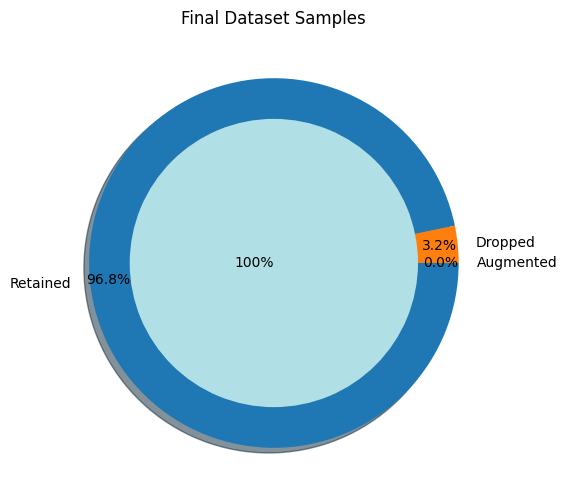


Inference:The final dataset after cleanup has 1106 samples & 13 columns.


In [ ]:
#Final Dataset size after performing Preprocessing

df = df5.copy()
plt.title('Final Dataset Samples')
plt.pie([df.shape[0], original_df.shape[0]-df4.shape[0], df5.shape[0]-df4.shape[0]], radius = 1, shadow=True,
        labels=['Retained','Dropped','Augmented'], counterclock=False, autopct='%1.1f%%', pctdistance=0.9, explode=[0,0,0])
plt.pie([df.shape[0]], labels=['100%'], labeldistance=-0, radius=0.78, shadow=True, colors=['powderblue'])
plt.show()

print('\n\033[1mInference:\033[0mThe final dataset after cleanup has {} samples & {} columns.'.format(df.shape[0], df.shape[1]))

4. Data Manipulation

In [ ]:
#Splitting the data intro training & testing sets

df = df5.copy()

X = df.drop([target],axis=1)
Y = df[target]
Train_X, Test_X, Train_Y, Test_Y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)

print('Original set  ---> ',X.shape,Y.shape,'\nTraining set  ---> ',Train_X.shape,Train_Y.shape,'\nTesting set   ---> ', Test_X.shape,'', Test_Y.shape)

Original set  --->  (1106, 12) (1106,) 
Training set  --->  (884, 12) (884,) 
Testing set   --->  (222, 12)  (222,)


In [ ]:
#Feature Scaling (Standardization)

std = StandardScaler()

print('\033[1mStandardardization on Training set'.center(100))
Train_X_std = std.fit_transform(Train_X)
Train_X_std = pd.DataFrame(Train_X_std, columns=X.columns)
display(Train_X_std.describe())

print('\n','\033[1mStandardardization on Testing set'.center(100))
Test_X_std = std.transform(Test_X)
Test_X_std = pd.DataFrame(Test_X_std, columns=X.columns)
display(Test_X_std.describe())

                               Standardardization on Training set                               


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Id
count,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02,8.840000e+02
mean,-1.085105e-16,-2.361108e-16,-6.028360e-17,-5.827415e-17,4.732263e-16,1.205672e-17,1.044916e-16,4.753362e-14,9.364053e-16,-3.797867e-16,1.396570e-15,-1.205672e-16
std,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00,1.000566e+00
min,-2.115665e+00,-2.270376e+00,-1.404382e+00,-1.462712e+00,-3.478132e+00,-1.441476e+00,-1.261210e+00,-3.514355e+00,-3.024290e+00,-2.313558e+00,-1.919040e+00,-1.712016e+00
25%,-6.922108e-01,-7.595139e-01,-8.847845e-01,-5.372630e-01,-5.442393e-01,-8.513791e-01,-7.837260e-01,-6.172186e-01,-6.997624e-01,-7.120603e-01,-8.174113e-01,-8.507257e-01
50%,-2.367055e-01,-8.801968e-02,-1.053889e-01,-2.596283e-01,-1.251118e-01,-2.121077e-01,-2.744094e-01,-5.263476e-02,-3.561170e-02,-2.024929e-01,-1.747949e-01,-1.321003e-02
75%,4.465523e-01,6.394324e-01,7.779262e-01,1.105514e-01,4.337248e-01,5.255131e-01,4.975235e-01,6.060464e-01,6.285390e-01,5.254605e-01,6.514263e-01,8.497012e-01
max,4.318347e+00,5.899471e+00,2.700435e+00,6.033426e+00,5.768075e+00,5.147937e+00,3.800123e+00,3.419688e+00,3.882877e+00,4.165227e+00,4.048113e+00,1.739629e+00



                                Standardardization on Testing set                                


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Id
count,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000
mean,-0.045373,0.181939,-0.230607,-0.048901,0.079017,-0.084519,-0.077680,-0.018750,0.081363,-0.093956,-0.099878,0.185418
std,1.023119,1.046474,0.996256,0.955382,1.063476,0.917029,0.934122,1.016232,1.064446,1.057668,0.941974,0.974410
min,-1.887912,-1.934629,-1.404382,-1.185077,-2.106442,-1.441476,-1.197546,-3.445439,-2.891460,-1.658400,-1.919040,-1.709855
25%,-0.692211,-0.535683,-1.144583,-0.606672,-0.429932,-0.851379,-0.751894,-0.651677,-0.434102,-0.784856,-0.897738,-0.554623
50%,-0.293644,0.205759,-0.287248,-0.305901,-0.023505,-0.310457,-0.338074,0.034836,0.030803,-0.348084,-0.358400,0.232101
75%,0.432318,0.751348,0.362249,0.018006,0.382921,0.402576,0.266739,0.509298,0.611935,0.361671,0.467822,1.089609
max,4.147532,4.500524,2.544556,4.367617,6.072895,3.672695,3.386303,3.446194,4.613443,5.184362,3.221892,1.733145


5. Feature Selection/Extraction

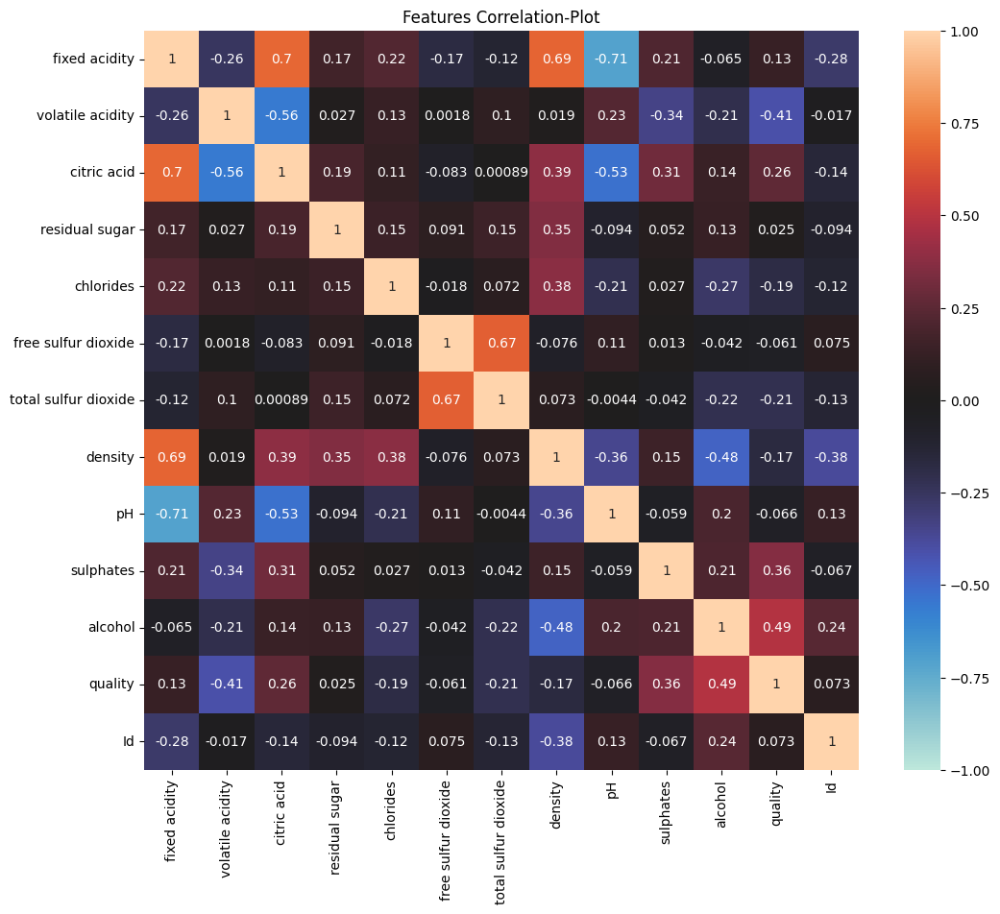

In [ ]:
#Checking the correlation

features = df.columns
plt.figure(figsize=[12,10])
plt.title('Features Correlation-Plot')
sns.heatmap(df[features].corr(), vmin=-1, vmax=1, center=0, annot=True) #,
plt.show()

100%|██████████| 11/11 [00:05<00:00,  2.06it/s]


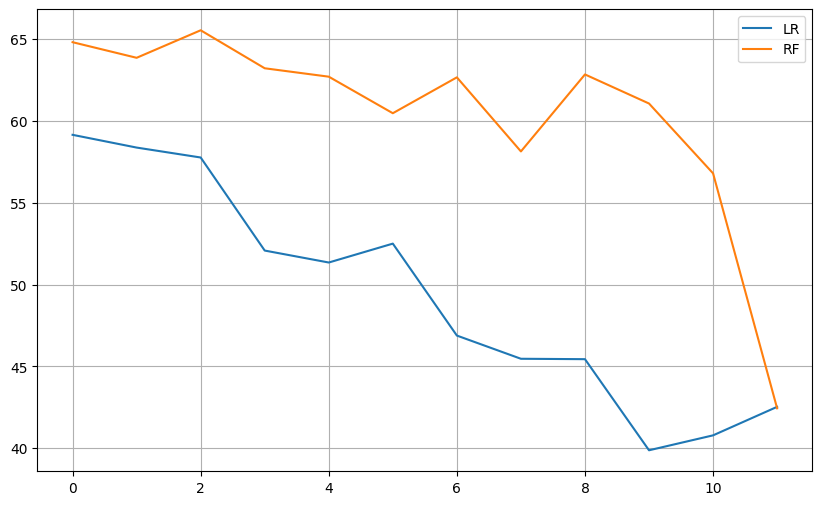

In [ ]:
# Calculate the VIFs to remove multicollinearity

DROP=[]; scores1=[]; scores2=[]; scores3=[]
#scores.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std, Train_Y).predict(Test_X_std)))
scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std.drop(DROP,axis=1), Train_Y).predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)
scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std.drop(DROP,axis=1), Train_Y).predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)
#scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std.drop(DROP,axis=1), Train_Y).predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)

for i in tqdm(range(len(X.columns.values)-1)):
    vif = pd.DataFrame()
    Xs = X.drop(DROP,axis=1)
    #print(DROP)
    vif['Features'] = Xs.columns
    vif['VIF'] = [variance_inflation_factor(Xs.values, i) for i in range(Xs.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    vif.reset_index(drop=True, inplace=True)
    DROP.append(vif.Features[0])
    if vif.VIF[0]>1:
        scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std.drop(DROP,axis=1), Train_Y).predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)
        scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std.drop(DROP,axis=1), Train_Y).predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)
        #scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std.drop(DROP,axis=1), Train_Y, eval_metric='logloss').predict(Test_X_std.drop(DROP,axis=1)),average='weighted')*100)
    #print(scores)

plt.plot(scores1, label='LR')
plt.plot(scores2, label='RF')
#plt.plot(scores3, label='XG')
#plt.ylim([0.7,0.85])
plt.legend()
plt.grid()
plt.show()

100%|██████████| 12/12 [00:09<00:00,  1.27it/s]


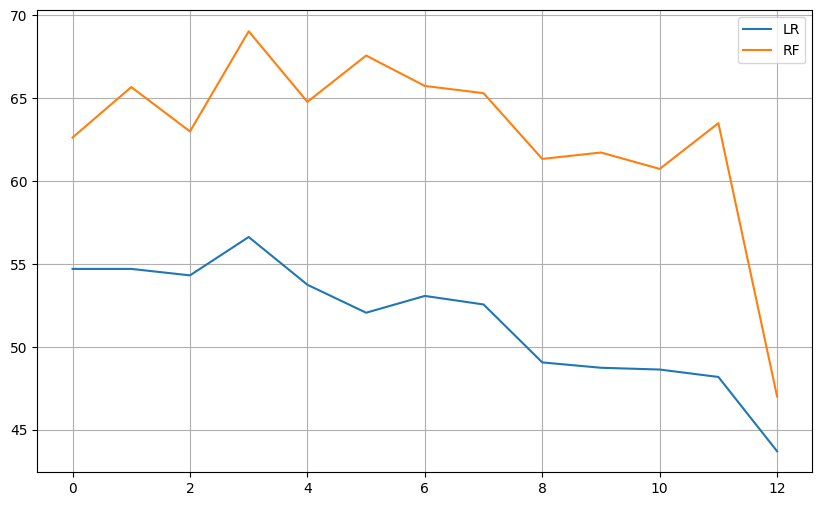

In [ ]:
# Applying Recurrsive Feature Elimination

# Running RFE with the output number of the variable equal to 10
LR = LogisticRegression()#.fit(Train_X_std, Train_Y)
scores1=[]; scores2=[]; scores3=[]
scores1.append(f1_score(Test_Y,LogisticRegression(solver='liblinear').fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
#scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std, Train_Y, eval_metric='logloss').predict(Test_X_std),average='weighted')*100)

for i in tqdm(range(len(X.columns.values))):
    rfe = RFE(LR,n_features_to_select=len(Train_X_std.columns)-i)
    rfe = rfe.fit(Train_X_std, Train_Y)
    scores1.append(f1_score(Test_Y,LogisticRegression(solver='liblinear').fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
    scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
    #scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y, eval_metric='logloss').predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)

plt.plot(scores1, label='LR')
plt.plot(scores2, label='RF')
#plt.plot(scores3, label='XG')
#plt.ylim([0.80,0.84])
plt.legend()
plt.grid()
plt.show()

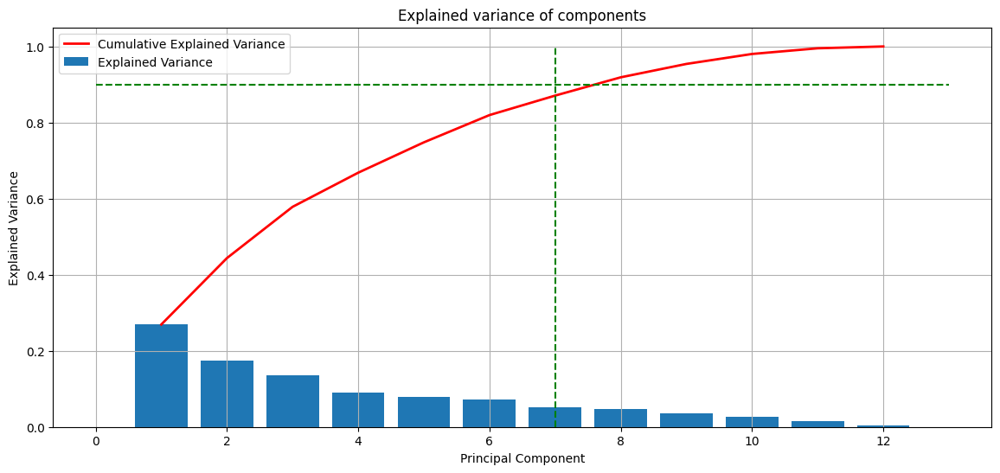

In [ ]:
from sklearn.decomposition import PCA

pca = PCA().fit(Train_X_std)

fig, ax = plt.subplots(figsize=(14,6))
x_values = range(1, pca.n_components_+1)
ax.bar(x_values, pca.explained_variance_ratio_, lw=2, label='Explained Variance')
ax.plot(x_values, np.cumsum(pca.explained_variance_ratio_), lw=2, label='Cumulative Explained Variance', color='red')
plt.plot([0,pca.n_components_+1],[0.90,0.90],'g--')
plt.plot([7,7],[0,1], 'g--')
ax.set_title('Explained variance of components')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')
plt.grid()
plt.legend()
plt.show()

100%|██████████| 12/12 [00:04<00:00,  2.41it/s]


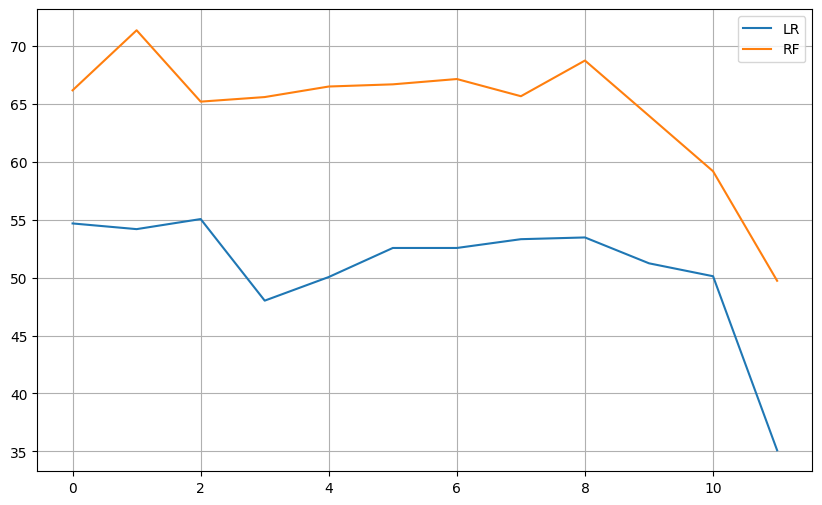

In [ ]:
#Applying PCA Transformations

# scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
# scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
# scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std, Train_Y, eval_metric='logloss').predict(Test_X_std),average='weighted')*100)

scores1=[]; scores2=[]; scores3=[]
for i in tqdm(range(len(X.columns.values))):
    pca = PCA(n_components=Train_X_std.shape[1]-i)
    Train_X_std_pca = pca.fit_transform(Train_X_std)
    #print('The shape of final transformed training feature set:')
    #print(Train_X_std_pca.shape)
    Train_X_std_pca = pd.DataFrame(Train_X_std_pca)

    Test_X_std_pca = pca.transform(Test_X_std)
    #print('\nThe shape of final transformed testing feature set:')
    #print(Test_X_std_pca.shape)
    Test_X_std_pca = pd.DataFrame(Test_X_std_pca)

    scores1.append(f1_score(Test_Y,LogisticRegression(solver='liblinear').fit(Train_X_std_pca, Train_Y).predict(Test_X_std_pca),average='weighted')*100)
    scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std_pca, Train_Y).predict(Test_X_std_pca),average='weighted')*100)
    #scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std_pca, Train_Y, eval_metric='logloss').predict(Test_X_std_pca),average='weighted')*100)


plt.plot(scores1, label='LR')
plt.plot(scores2, label='RF')
#plt.plot(scores3, label='XG')
#plt.ylim([0.80,0.84])
plt.legend()
plt.grid()
plt.show()

In [ ]:
#### Finalising the shortlisted features

rfe = RFE(LR,n_features_to_select=len(Train_X_std.columns))
rfe = rfe.fit(Train_X_std, Train_Y)

print(f1_score(Test_Y,LogisticRegression().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
print(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
#print(f1_score(Test_Y,XGBClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y, eval_metric='logloss').predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)

# Train_X_std = Train_X_std[Train_X_std.columns[rfe.support_]]
# Test_X_std = Test_X_std[Test_X_std.columns[rfe.support_]]

print(Train_X_std.shape)
print(Test_X_std.shape)

59.14900884548964
64.79765386315125
(884, 12)
(222, 12)


6. Predictive Modeling

In [ ]:
#Let us create first create a table to store the results of various models

Evaluation_Results = pd.DataFrame(np.zeros((6,5)), columns=['Accuracy', 'Precision','Recall','F1-score','AUC-ROC score'])
Evaluation_Results.index=['Logistic Regression (LR)','Decision Tree Classifier (DT)','Random Forest Classifier (RF)','Naïve Bayes Classifier (NB)',
                         'Support Vector Machine (SVM)','K Nearest Neighbours (KNN)']
Evaluation_Results

,Accuracy,Precision,Recall,F1-score,AUC-ROC score
Logistic Regression (LR),0.0,0.0,0.0,0.0,0.0
Decision Tree Classifier (DT),0.0,0.0,0.0,0.0,0.0
Random Forest Classifier (RF),0.0,0.0,0.0,0.0,0.0
Naïve Bayes Classifier (NB),0.0,0.0,0.0,0.0,0.0
Support Vector Machine (SVM),0.0,0.0,0.0,0.0,0.0
K Nearest Neighbours (KNN),0.0,0.0,0.0,0.0,0.0


In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

def auc_roc(y_true, y_prob, curves=['each_class']):
    fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])  # Assuming binary classification
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange',
             lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")


In [ ]:
#Let us define functions to summarise the Prediction's scores .

from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

def Classification_Summary(pred, pred_prob, i):
    print('\n\033[1mClassification Report:\033[0m\n', classification_report(Test_Y, pred))

    # Handle multiclass ROC curve
    classes = np.unique(Test_Y)
    Test_Y_bin = label_binarize(Test_Y, classes=classes)
    n_classes = len(classes)

    # Plot ROC curve for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(Test_Y_bin[:, j], pred_prob[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    plt.figure()
    for j in range(n_classes):
        plt.plot(fpr[j], tpr[j],
                 label=f'Class {classes[j]} (AUC = {roc_auc[j]:0.2f})')

    plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multiclass ROC Curve')
    plt.legend(loc="lower right")
    plt.show()


#Visualising Function
def AUC_ROC_plot(Test_Y, pred):
    ref = [0 for _ in range(len(Test_Y))]
    ref_auc = roc_auc_score(Test_Y, ref)
    lr_auc = roc_auc_score(Test_Y, pred)

    ns_fpr, ns_tpr, _ = roc_curve(Test_Y, ref)
    lr_fpr, lr_tpr, _ = roc_curve(Test_Y, pred)

    plt.plot(ns_fpr, ns_tpr, linestyle='--')
    plt.plot(lr_fpr, lr_tpr, marker='.', label='AUC = {}'.format(round(roc_auc_score(Test_Y, pred)*100,2)))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()

1. Logistic Regression


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.67      0.78      0.72        98
           6       0.50      0.59      0.54        85
           7       0.43      0.10      0.16        30
           8       0.00      0.00      0.00         1

    accuracy                           0.58       222
   macro avg       0.27      0.24      0.24       222
weighted avg       0.55      0.58      0.55       222



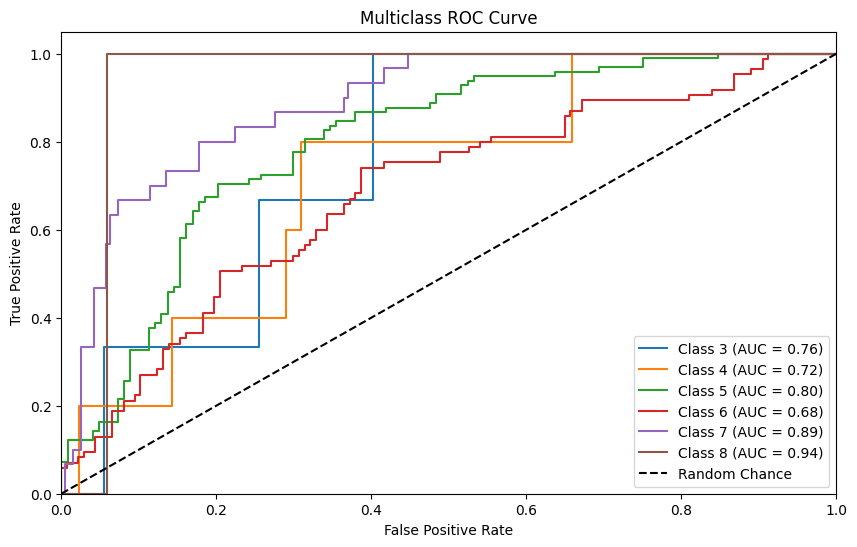


Interpreting the Output of Logistic Regression:

intercept  -5.128876939281194
classes [3 4 5 6 7 8]


,coeff
fixed acidity,0.103356
volatile acidity,0.759100
citric acid,0.107347
residual sugar,-0.145438
chlorides,0.030426
free sulfur dioxide,-0.064011
total sulfur dioxide,-0.198550
density,0.016799
pH,0.171401
sulphates,0.053664


In [ ]:
# Building Logistic Regression Classifier

LR_model = LogisticRegression(solver='liblinear')

space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['l2'] #'none', 'l1', 'l2', 'elasticnet'
space['C'] = loguniform(1e-5, 100)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

#RCV = RandomizedSearchCV(LR_model, space, n_iter=50, scoring='accuracy', n_jobs=-1, cv=5, random_state=1)

LR = LR_model.fit(Train_X_std, Train_Y)#.best_estimator_
pred = LR.predict(Test_X_std)
pred_prob = LR.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,0)

print('\n\033[1mInterpreting the Output of Logistic Regression:\n\033[0m')

print('intercept ', LR.intercept_[0])
print('classes', LR.classes_)
display(pd.DataFrame({'coeff': LR.coef_[0]}, index=Train_X_std.columns))


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.65      0.54      0.59        98
           6       0.44      0.72      0.54        85
           7       0.00      0.00      0.00        30
           8       0.00      0.00      0.00         1

    accuracy                           0.51       222
   macro avg       0.18      0.21      0.19       222
weighted avg       0.45      0.51      0.47       222



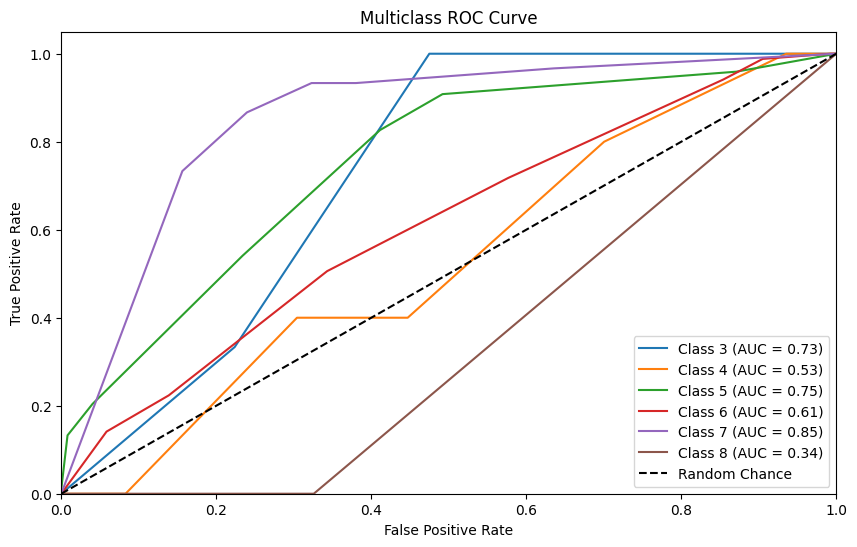


Interpreting the output of Decision Tree:



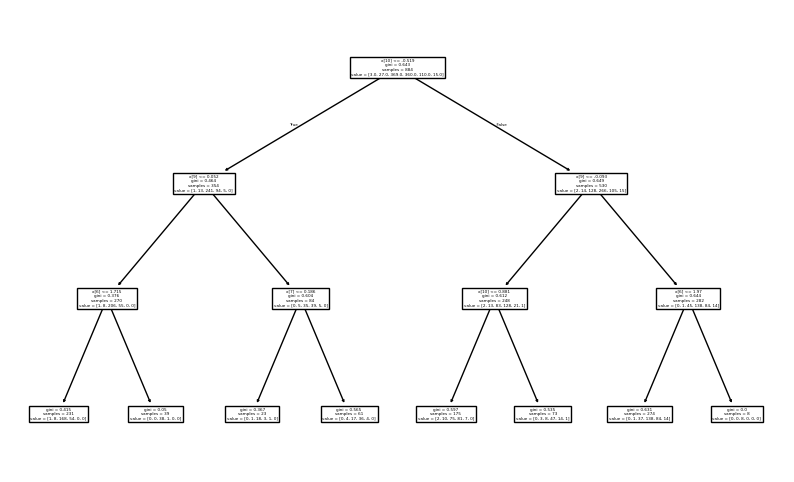

In [ ]:
#Building Decision Tree Classifier

DT_model = DecisionTreeClassifier()

param_dist = {"max_depth": [3, None],
              "max_features": randint(1, len(features)-1),
              "min_samples_leaf": randint(1, len(features)-1),
              "criterion": ["gini", "entropy"]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(DT_model, param_dist, n_iter=50, scoring='f1_weighted', n_jobs=-1, cv=5, random_state=1)

DT = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = DT.predict(Test_X_std)
pred_prob = DT.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,1)

print('\n\033[1mInterpreting the output of Decision Tree:\n\033[0m')
tree.plot_tree(DT)
plt.show()


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.69      0.77      0.72        98
           6       0.62      0.66      0.64        85
           7       0.82      0.60      0.69        30
           8       0.00      0.00      0.00         1

    accuracy                           0.67       222
   macro avg       0.35      0.34      0.34       222
weighted avg       0.65      0.67      0.66       222



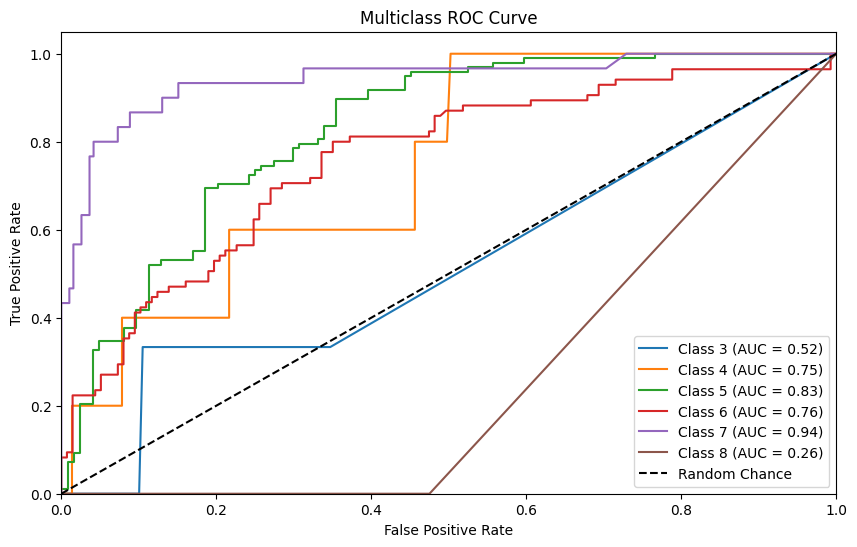


Interpreting the output of Random Forest:



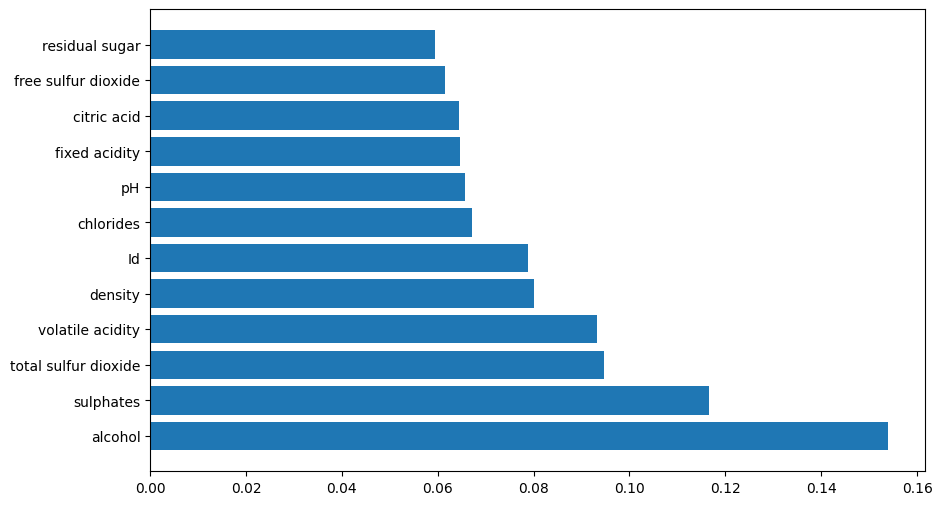

In [ ]:
# Building Random-Forest Classifier

RF_model = RandomForestClassifier()

param_dist={'bootstrap': [True, False],
            'max_depth': [10, 20, 50, 100, None],
            'max_features': ['auto', 'sqrt'],
            'min_samples_leaf': [1, 2, 4],
            'min_samples_split': [2, 5, 10],
            'n_estimators': [50, 100]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(RF_model, param_dist, n_iter=50, scoring='f1_weighted', n_jobs=-1, cv=5, random_state=1)

RF = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = RF.predict(Test_X_std)
pred_prob = RF.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,2)

print('\n\033[1mInterpreting the output of Random Forest:\n\033[0m')
rfi=pd.Series(RF.feature_importances_, index=Train_X_std.columns).sort_values(ascending=False)
plt.barh(rfi.index,rfi.values)
plt.show()


In [ ]:

# Save the trained Random Forest model
import pickle
from google.colab import files  # Comment this line if not using Colab

filename = 'random_forest_wine_model.pkl'
with open(filename, 'wb') as file:
    pickle.dump(RF, file)

# Download the model file if using Colab
files.download(filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.67      0.70      0.69        98
           6       0.54      0.59      0.56        85
           7       0.70      0.63      0.67        30
           8       0.00      0.00      0.00         1

    accuracy                           0.62       222
   macro avg       0.32      0.32      0.32       222
weighted avg       0.60      0.62      0.61       222



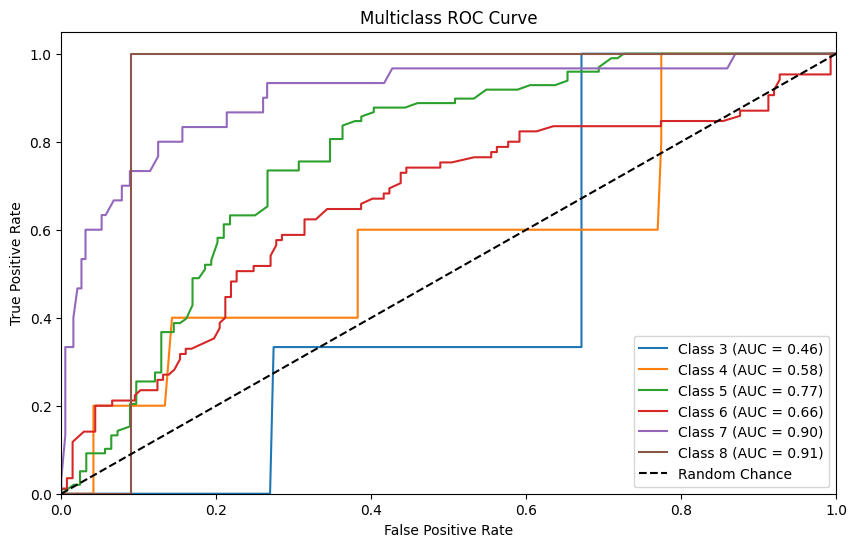

In [ ]:
# Building Naive Bayes Classifier

NB_model = BernoulliNB()

params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0]}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(NB_model, params, n_iter=50, scoring='f1_weighted', n_jobs=-1, cv=5, random_state=1)

NB = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = NB.predict(Test_X_std)
pred_prob = NB.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,3)


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.66      0.71      0.69        98
           6       0.53      0.64      0.58        85
           7       0.71      0.33      0.45        30
           8       0.00      0.00      0.00         1

    accuracy                           0.60       222
   macro avg       0.32      0.28      0.29       222
weighted avg       0.59      0.60      0.59       222



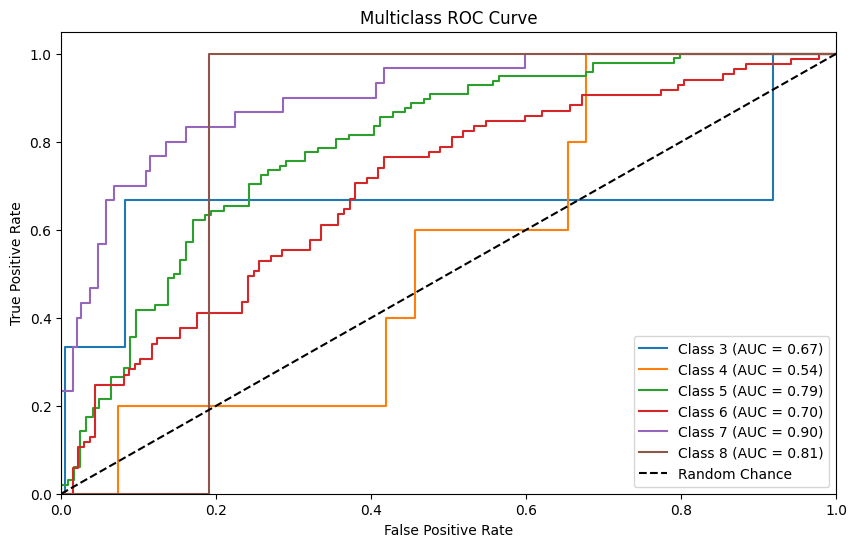

In [ ]:
# Building Support Vector Machine Classifier

SVM_model = SVC(probability=True).fit(Train_X_std, Train_Y)

svm_param = {"C": [.01, .1, 1, 5, 10, 100],
             "gamma": [.01, .1, 1, 5, 10, 100],
             "kernel": ["rbf"],
             "random_state": [1]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

#RCV = RandomizedSearchCV(SVM_model, svm_param, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1)

SVM = SVM_model.fit(Train_X_std, Train_Y)#.best_estimator_
pred = SVM.predict(Test_X_std)
pred_prob = SVM.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,4)


Classification Report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.71      0.68      0.70        98
           6       0.58      0.71      0.63        85
           7       0.83      0.67      0.74        30
           8       0.00      0.00      0.00         1

    accuracy                           0.66       222
   macro avg       0.35      0.34      0.35       222
weighted avg       0.65      0.66      0.65       222



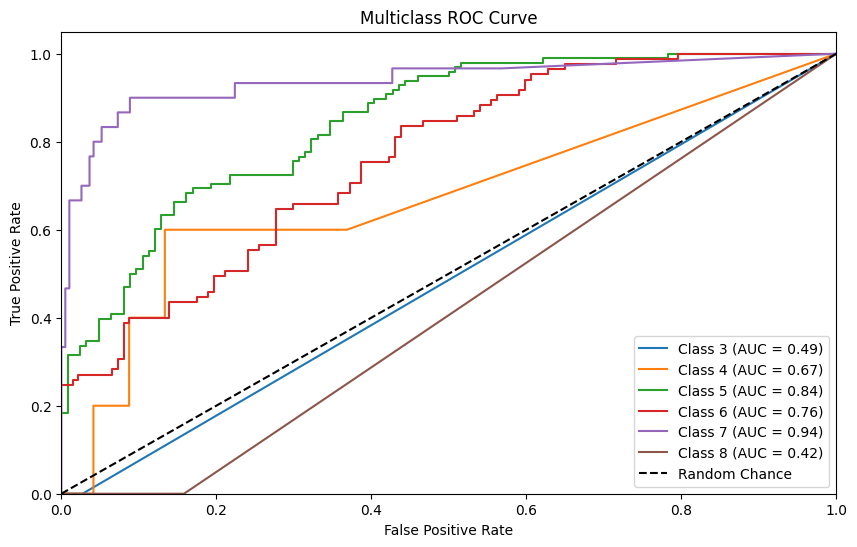

In [ ]:
# Building K-Neareset Neighbours Classifier

KNN_model = KNeighborsClassifier()

knn_param = {"n_neighbors": [i for i in range(1,30,5)],
             "weights": ["uniform", "distance"],
             "algorithm": ["ball_tree", "kd_tree", "brute"],
             "leaf_size": [1, 10, 30],
             "p": [1,2]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(KNN_model, knn_param, n_iter=50, scoring='f1_weighted', n_jobs=-1, cv=5, random_state=1)

KNN = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = KNN.predict(Test_X_std)
pred_prob = KNN.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,5)

Confusion matrices


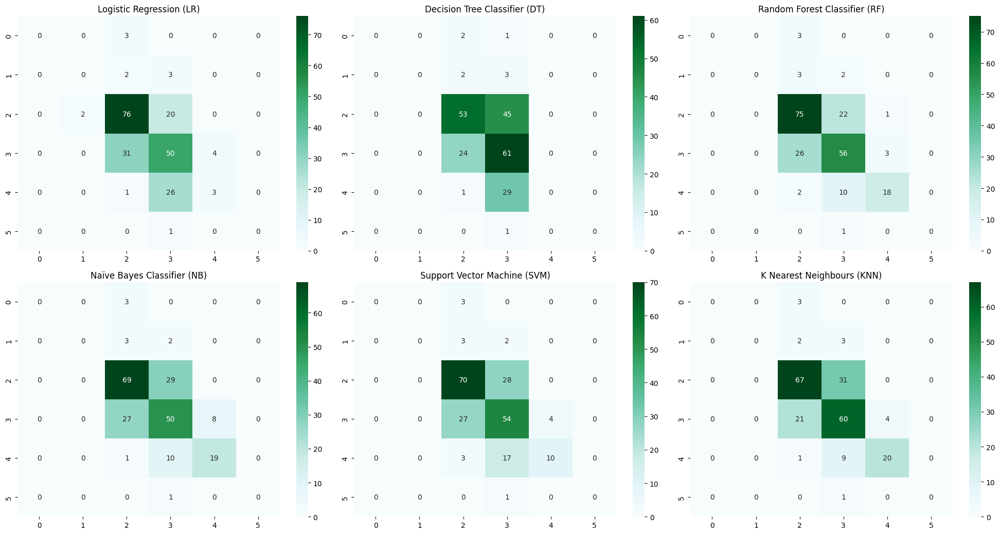

In [ ]:
#Plotting Confusion-Matrix of all the predictive Models

def plot_cm(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=np.unique(y_true), columns=np.unique(y_true))
    cm.columns=labels
    cm.index=labels
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    #fig, ax = plt.subplots()
    sns.heatmap(cm, annot=annot, fmt='')# cmap= "GnBu"

def conf_mat_plot(all_models):
    plt.figure(figsize=[20,3.5*math.ceil(len(all_models)*len(labels)/14)])

    for i in range(len(all_models)):
        if len(labels)<=4:
            plt.subplot(2,4,i+1)
        else:
            plt.subplot(math.ceil(len(all_models)/3),3,i+1)
        pred = all_models[i].predict(Test_X_std)
        #plot_cm(Test_Y, pred)
        sns.heatmap(confusion_matrix(Test_Y, pred), annot=True, cmap='BuGn', fmt='.0f') #vmin=0,vmax=5
        plt.title(Evaluation_Results.index[i])
    plt.tight_layout()
    plt.show()

conf_mat_plot([LR,DT,RF,NB,SVM,KNN])

comparison among classifiers

                                      ML Algorithms Comparison                                      


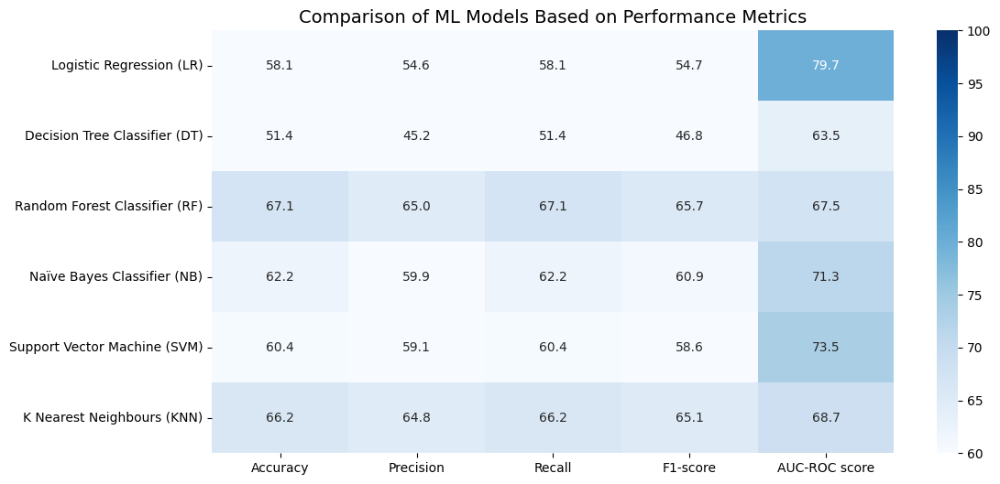

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

# Create the result table
Evaluation_Results = pd.DataFrame(np.zeros((6, 5)),
    columns=['Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC-ROC score'])

Evaluation_Results.index = [
    'Logistic Regression (LR)',
    'Decision Tree Classifier (DT)',
    'Random Forest Classifier (RF)',
    'Naïve Bayes Classifier (NB)',
    'Support Vector Machine (SVM)',
    'K Nearest Neighbours (KNN)'
]

# Binarize labels if multiclass (for AUC)
classes = np.unique(Test_Y)
Test_Y_bin = label_binarize(Test_Y, classes=classes)
is_multiclass = len(classes) > 2

# Define your models dictionary
models = {
    'Logistic Regression (LR)': LR,
    'Decision Tree Classifier (DT)': DT,
    'Random Forest Classifier (RF)': RF,
    'Naïve Bayes Classifier (NB)': NB,
    'Support Vector Machine (SVM)': SVM,
    'K Nearest Neighbours (KNN)': KNN
}

# Fill the results
for name, model in models.items():
    pred = model.predict(Test_X_std)
    prob = model.predict_proba(Test_X_std) if hasattr(model, "predict_proba") else None

    acc = accuracy_score(Test_Y, pred) * 100
    prec = precision_score(Test_Y, pred, average='weighted') * 100
    rec = recall_score(Test_Y, pred, average='weighted') * 100
    f1 = f1_score(Test_Y, pred, average='weighted') * 100

    # Handle multiclass AUC
    if is_multiclass and prob is not None:
        auc = roc_auc_score(Test_Y_bin, prob, multi_class='ovr') * 100
    elif prob is not None:
        auc = roc_auc_score(Test_Y, prob[:, 1]) * 100
    else:
        auc = np.nan  # Model does not support predict_proba

    Evaluation_Results.loc[name] = [acc, prec, rec, f1, auc]

# Plotting the results
print('\033[1m' + 'ML Algorithms Comparison'.center(100) + '\033[0m')
plt.figure(figsize=[12, 6])
sns.heatmap(Evaluation_Results, annot=True, vmin=60, vmax=100, cmap='Blues', fmt='.1f')
plt.title("Comparison of ML Models Based on Performance Metrics", fontsize=14)
plt.yticks(rotation=0)
plt.show()


using LSTM and Bi-LSTM

In [ ]:
# === Import Libraries ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from keras.models import Sequential
from keras.layers import LSTM, Bidirectional, Dense
from keras.utils import to_categorical

# === Load and preprocess the dataset ===
# Replace with your dataset path or loading method
data = pd.read_csv("WineQT.csv")  # Or white.csv

# Features and labels
X = data.drop("quality", axis=1)
Y = data["quality"]

# Encode labels if not already integers starting from 0
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)

# Split data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=42, stratify=Y_encoded)

# Feature Scaling
scaler = StandardScaler()
Train_X_std = scaler.fit_transform(X_train)
Test_X_std = scaler.transform(X_test)

# Reshape input for LSTM [samples, timesteps, features]
Train_X_std = Train_X_std.reshape((Train_X_std.shape[0], 1, Train_X_std.shape[1]))
Test_X_std = Test_X_std.reshape((Test_X_std.shape[0], 1, Test_X_std.shape[1]))

# One-hot encode targets
num_classes = len(np.unique(Y_encoded))
Y_train_cat = to_categorical(Y_train, num_classes)
Y_test_cat = to_categorical(Y_test, num_classes)

# === LSTM Model ===
lstm_model = Sequential()
lstm_model.add(LSTM(64, input_shape=(Train_X_std.shape[1], Train_X_std.shape[2])))
lstm_model.add(Dense(num_classes, activation='softmax'))
lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train LSTM
lstm_model.fit(Train_X_std, Y_train_cat, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate LSTM
Y_pred_lstm = lstm_model.predict(Test_X_std)
Y_pred_labels_lstm = np.argmax(Y_pred_lstm, axis=1)

# === Bi-LSTM Model ===
bilstm_model = Sequential()
bilstm_model.add(Bidirectional(LSTM(64), input_shape=(Train_X_std.shape[1], Train_X_std.shape[2])))
bilstm_model.add(Dense(num_classes, activation='softmax'))
bilstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train Bi-LSTM
bilstm_model.fit(Train_X_std, Y_train_cat, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate Bi-LSTM
Y_pred_bilstm = bilstm_model.predict(Test_X_std)
Y_pred_labels_bilstm = np.argmax(Y_pred_bilstm, axis=1)

# === Evaluation Function ===
def evaluate_model(true, pred, model_name):
    print(f"\n\033[1m{model_name} Evaluation:\033[0m")
    print("Accuracy :", accuracy_score(true, pred) * 100)
    print("Precision:", precision_score(true, pred, average='weighted') * 100)
    print("Recall   :", recall_score(true, pred, average='weighted') * 100)
    print("F1-Score :", f1_score(true, pred, average='weighted') * 100)

# Evaluate both models
evaluate_model(Y_test, Y_pred_labels_lstm, "LSTM")
evaluate_model(Y_test, Y_pred_labels_bilstm, "Bi-LSTM")


Epoch 1/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.2660 - loss: 1.7684 - val_accuracy: 0.4918 - val_loss: 1.6974
Epoch 2/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5143 - loss: 1.6716 - val_accuracy: 0.5956 - val_loss: 1.6004
Epoch 3/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5578 - loss: 1.5690 - val_accuracy: 0.6175 - val_loss: 1.4918
Epoch 4/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5566 - loss: 1.4656 - val_accuracy: 0.5902 - val_loss: 1.3754
Epoch 5/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5643 - loss: 1.3518 - val_accuracy: 0.5738 - val_loss: 1.2653
Epoch 6/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5943 - loss: 1.2205 - val_accuracy: 0.5738 - val_loss: 1.1760
Epoch 7/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5333 - loss: 1.1772 - val_accuracy: 0.5792 - val_loss: 1.1162
Epoch 8/20
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5850 - loss: 1.0695 - val_accuracy: 0.5847 - val_loss

In [ ]:
!pip install flask_ngrok

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving random_forest_wine_model.pkl to random_forest_wine_model (1).pkl


In [ ]:
import os
import numpy as np
import pickle
from flask import Flask, render_template_string, request
from flask_ngrok import run_with_ngrok

# Load the model (make sure it matches the 12 features)
model = pickle.load(open('random_forest_wine_model.pkl', 'rb'))

# Create Flask app
app = Flask(__name__)
run_with_ngrok(app)

# HTML + CSS + JS Code (all inline for Colab compatibility)
html_code = '''
<!DOCTYPE html>
<html>
<head>
    <title>Wine Quality Prediction</title>
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color: #f1f1f1;
            padding: 30px;
        }
        .container {
            background: #fff;
            padding: 25px;
            border-radius: 10px;
            width: 500px;
            margin: auto;
            box-shadow: 0px 0px 15px rgba(0,0,0,0.2);
        }
        input[type=number] {
            width: 100%;
            padding: 8px;
            margin: 10px 0;
            border-radius: 5px;
            border: 1px solid #ccc;
        }
        button {
            background: #007bff;
            color: white;
            padding: 10px 20px;
            border: none;
            border-radius: 5px;
        }
        .result {
            margin-top: 15px;
            font-weight: bold;
            color: green;
        }
    </style>
    <script>
        function validateForm() {
            let inputs = document.querySelectorAll("input[type='number']");
            let button = document.querySelector("button");
            let valid = true;
            inputs.forEach(input => {
                if (input.value === "") valid = false;
            });
            button.disabled = !valid;
        }

        document.addEventListener("DOMContentLoaded", () => {
            document.querySelectorAll("input").forEach(input => {
                input.addEventListener("input", validateForm);
            });
            validateForm();
        });
    </script>
</head>
<body>
    <div class="container">
        <h2>Wine Quality Prediction</h2>
        <form method="post">

            <label>Fixed Acidity</label>
            <input type="number" name="fixed_acidity" step="any" required>

            <label>Volatile Acidity</label>
            <input type="number" name="volatile_acidity" step="any" required>

            <label>Citric Acid</label>
            <input type="number" name="citric_acid" step="any" required>

            <label>Residual Sugar</label>
            <input type="number" name="residual_sugar" step="any" required>

            <label>Chlorides</label>
            <input type="number" name="chlorides" step="any" required>

            <label>Free Sulfur Dioxide</label>
            <input type="number" name="free_sulfur_dioxide" step="any" required>

            <label>Total Sulfur Dioxide</label>
            <input type="number" name="total_sulfur_dioxide" step="any" required>

            <label>Density</label>
            <input type="number" name="density" step="any" required>

            <label>pH</label>
            <input type="number" name="ph" step="any" required>

            <label>Sulphates</label>
            <input type="number" name="sulphates" step="any" required>

            <label>Alcohol</label>
            <input type="number" name="alcohol" step="any" required>

            <button type="submit">Predict</button>
        </form>
        {% if prediction %}
            <p class="result">Predicted Wine Quality: {{ prediction }}</p>
        {% endif %}
    </div>
</body>
</html>
'''

@app.route('/', methods=['GET', 'POST'])
def predict():
    prediction = None
    if request.method == 'POST':
        try:
            features = [float(value) for value in request.form.values()]
            input_data = np.array([features])
            prediction = model.predict(input_data)[0]
        except Exception as e:
            prediction = f"Error: {e}"
    return render_template_string(html_code, prediction=prediction)

# Start the Flask app with ngrok tunnel
app.run()


 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
Exception in thread Thread-10:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/urllib3/connection.py", line 198, in _new_conn
    sock = connection.create_connection(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/urllib3/util/connection.py", line 85, in create_connection
    raise err
  File "/usr/local/lib/python3.11/dist-packages/urllib3/util/connection.py", line 73, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/urllib3/connectionpool.py", line 787, in urlopen
    response = self._make_request(
           

In [ ]:
import pandas as pd
df=pd.read_csv("WineQT.csv")
features=df.columns
print("Input Shape:", np.array([features]).shape)


Input Shape: (1, 13)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler

# Load the dataset
df = pd.read_csv('/content/WineQT.csv')

# Drop 'type' feature
if 'type' in df.columns:
    df.drop(columns=['type'], inplace=True)

# Split features and target
X = df.drop('quality', axis=1)
y = df['quality']

# Standardize the data
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Train-test split
from sklearn.model_selection import train_test_split
Train_X_std, Test_X_std, Train_Y, Test_Y = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build and tune Random Forest
RF_model = RandomForestClassifier()

param_dist = {
    'bootstrap': [True],
    'max_depth': [10, 50],
    'max_features': ['sqrt'],
    'min_samples_leaf': [1, 2],
    'min_samples_split': [2, 5],
    'n_estimators': [50, 100]
}

# Reduce to 10 iterations instead of 50
RCV = RandomizedSearchCV(
    RF_model, param_dist, n_iter=10, scoring='f1_weighted',
    n_jobs=-1, cv=3, random_state=1  # Use 3-fold instead of 5 or 10
)


RF = RCV.fit(Train_X_std, Train_Y)

# Evaluate
pred = RF.predict(Test_X_std)
print(classification_report(Test_Y, pred))


              precision    recall  f1-score   support

           4       0.00      0.00      0.00         6
           5       0.70      0.76      0.73        96
           6       0.64      0.66      0.65        99
           7       0.71      0.65      0.68        26
           8       0.00      0.00      0.00         2

    accuracy                           0.68       229
   macro avg       0.41      0.41      0.41       229
weighted avg       0.65      0.68      0.66       229



In [ ]:
import pickle

with open('rf_model.pkl', 'wb') as f:
    pickle.dump(RF, f)

with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)


In [ ]:
from flask import Flask, request, render_template_string
import numpy as np
import pickle

app = Flask(__name__)

# Load trained model and scaler
with open('rf_model.pkl', 'rb') as f:
    model = pickle.load(f)

with open('scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)

# HTML Form Template
html_form = '''
<!DOCTYPE html>
<html>
<head>
    <title>Wine Quality Prediction</title>
    <style>
        body { font-family: Arial; background-color: #f2f2f2; text-align: center; padding: 20px; }
        input, button { padding: 8px; margin: 5px; width: 300px; }
        form { background-color: white; display: inline-block; padding: 20px; border-radius: 10px; box-shadow: 0px 0px 10px #ccc; }
        h2 { color: #333; }
    </style>
</head>
<body>
    <h2>Wine Quality Prediction</h2>
    <form action="/predict" method="post">
        <input type="number" step="any" name="fixed_acidity" placeholder="Fixed Acidity" required><br>
        <input type="number" step="any" name="volatile_acidity" placeholder="Volatile Acidity" required><br>
        <input type="number" step="any" name="citric_acid" placeholder="Citric Acid" required><br>
        <input type="number" step="any" name="residual_sugar" placeholder="Residual Sugar" required><br>
        <input type="number" step="any" name="chlorides" placeholder="Chlorides" required><br>
        <input type="number" step="any" name="free_sulfur_dioxide" placeholder="Free Sulfur Dioxide" required><br>
        <input type="number" step="any" name="total_sulfur_dioxide" placeholder="Total Sulfur Dioxide" required><br>
        <input type="number" step="any" name="density" placeholder="Density" required><br>
        <input type="number" step="any" name="pH" placeholder="pH" required><br>
        <input type="number" step="any" name="sulphates" placeholder="Sulphates" required><br>
        <input type="number" step="any" name="alcohol" placeholder="Alcohol" required><br>
        <button type="submit">Predict Quality</button>
    </form>
    {% if prediction %}
        <h3>Predicted Wine Quality: {{ prediction }}</h3>
    {% endif %}
</body>
</html>
'''

# Routes
@app.route('/')
def home():
    return render_template_string(html_form)

@app.route('/predict', methods=['POST'])
def predict():
    try:
        features = [float(request.form[key]) for key in request.form]
        if len(features) != 11:
            return "Error: Expected 11 features, got {}".format(len(features))

        scaled_input = scaler.transform([features])
        prediction = model.predict(scaled_input)[0]

        return render_template_string(html_form, prediction=int(prediction))

    except Exception as e:
        return f"Error during prediction: {e}"

if __name__ == '__main__':
    app.run(debug=True)


 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat
